<a href="https://colab.research.google.com/github/JomarQr/Artificial-Intelligence-path/blob/main/Neural_Networks_with_numpy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 4. Neural Networks with numpy. Regression.

Please, do not hesitate to reach out, if you have questions or need help.

You have a chance to submit the improvemts to your assignemets during one week after evaluation.

### Task 1. (50 points)
Use the same artificially generated dataset as in classroom. Namely,

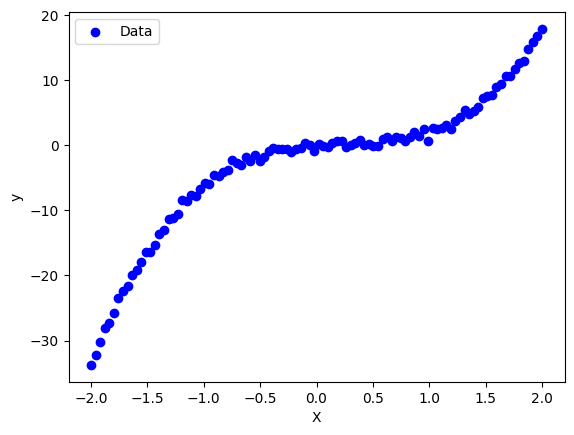

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Generate synthetic dataset (nonlinear regression)
np.random.seed(42)
X = np.linspace(-2, 2, 100).reshape(-1, 1)  # One feature
y = 3 * X**3 - 2 * X**2 + X + np.random.normal(0, 0.5, size=(100, 1))  # Nonlinear function with noise


plt.scatter(X, y, label="Data", color="blue")
plt.xlabel("X")
plt.ylabel("y")
plt.legend()
plt.show()


Create new neural network architectures similarly to the NeuralNetwork class defined in the classroom, so that it has:


* A:  Two hidden layers of different size, activation function relu;
* B:  Four hidden layers of the different size and sigmoid activation sigmoid $\sigma(z)=\frac{1}{1+e^{-z}}$;

Train 12 different models:
1. Model of class A that has the size of hidden layers h1=6 and h2=8 trianed on 10, 100, 500 trianining epochs. Trian on 2 different train/ test splits: 70/30 and 90/10. (6 different models, based on one architecture(the class that we define for that network))
2.Model of class B that has size of hidden layers h1=5, h2=10, h3=12, h4=4. Possible number of training epochs 10, 100, 500 trianining epochs. Train on 2 different train/ test splits: 70/30 and 90/10. (6 different models, based on one architecture(the class that we define for that network))

Rigth after training evaluate each of your models on the train and test datasets. Compare the results and comment on those. Would it be possible to compare the results for the different test/split  if we have not had the scaling factor $1/m$ in the loss function? Explain your opinion.



In [ ]:
class NeuralNetworkA:
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size, learning_rate=0.01):
        self.W1 = np.random.randn(input_size, hidden_size1) * 0.1
        self.b1 = np.zeros((1, hidden_size1))
        self.W2 = np.random.randn(hidden_size1, hidden_size2) * 0.1
        self.b2 = np.zeros((1, hidden_size2))
        self.W3 = np.random.randn(hidden_size2, output_size) * 0.1
        self.b3 = np.zeros((1, output_size))
        self.learning_rate = learning_rate

    def relu(self, Z):
        return np.maximum(0, Z)

    def relu_derivative(self, Z):
        return Z > 0

    def forward(self, X):
        self.Z1 = np.dot(X, self.W1) + self.b1
        self.A1 = self.relu(self.Z1)
        self.Z2 = np.dot(self.A1, self.W2) + self.b2
        self.A2 = self.relu(self.Z2)
        self.Z3 = np.dot(self.A2, self.W3) + self.b3
        return self.Z3

    def loss(self, X, y):
        predictions = self.forward(X)
        loss = np.mean((predictions - y) ** 2)
        return loss

    def backward(self, X, y):
        m = X.shape[0]
        y_pred = self.forward(X)

        # Compute gradients
        dZ3 = y_pred - y
        dW3 = (1 / m) * np.dot(self.A2.T, dZ3)
        db3 = (1 / m) * np.sum(dZ3, axis=0, keepdims=True)

        dA2 = np.dot(dZ3, self.W3.T)
        dZ2 = dA2 * self.relu_derivative(self.Z2)
        dW2 = (1 / m) * np.dot(self.A1.T, dZ2)
        db2 = (1 / m) * np.sum(dZ2, axis=0, keepdims=True)

        dA1 = np.dot(dZ2, self.W2.T)
        dZ1 = dA1 * self.relu_derivative(self.Z1)
        dW1 = (1 / m) * np.dot(X.T, dZ1)
        db1 = (1 / m) * np.sum(dZ1, axis=0, keepdims=True)

        # Weight update
        self.W1 -= self.learning_rate * dW1
        self.b1 -= self.learning_rate * db1
        self.W2 -= self.learning_rate * dW2
        self.b2 -= self.learning_rate * db2
        self.W3 -= self.learning_rate * dW3
        self.b3 -= self.learning_rate * db3

    def train(self, X, y, epochs=100):
        for epoch in range(epochs):
            self.backward(X, y)

            if epoch % 10 == 0:
                loss = self.loss(X, y)
                print(f"Epoch {epoch + 1}/{epochs}, Loss: {loss:.4f}")

    def predict(self, X):
        return self.forward(X)

In [ ]:
class NeuralNetworkB:
    def __init__(self, input_size, hidden_size1, hidden_size2, hidden_size3, hidden_size4, output_size, learning_rate=0.01):
        self.W1 = np.random.randn(input_size, hidden_size1) * 0.1
        self.b1 = np.zeros((1, hidden_size1))
        self.W2 = np.random.randn(hidden_size1, hidden_size2) * 0.1
        self.b2 = np.zeros((1, hidden_size2))
        self.W3 = np.random.randn(hidden_size2, hidden_size3) * 0.1
        self.b3 = np.zeros((1, hidden_size3))
        self.W4 = np.random.randn(hidden_size3, hidden_size4) * 0.1
        self.b4 = np.zeros((1, hidden_size4))
        self.W5 = np.random.randn(hidden_size4, output_size) * 0.1
        self.b5 = np.zeros((1, output_size))
        self.learning_rate = learning_rate

    def sigmoid(self, Z):
        return 1 / (1 + np.exp(-Z))

    def sigmoid_derivative(self, Z):
        s = self.sigmoid(Z)
        return s * (1 - s)

    def forward(self, X):
        self.Z1 = np.dot(X, self.W1) + self.b1
        self.A1 = self.sigmoid(self.Z1)
        self.Z2 = np.dot(self.A1, self.W2) + self.b2
        self.A2 = self.sigmoid(self.Z2)
        self.Z3 = np.dot(self.A2, self.W3) + self.b3
        self.A3 = self.sigmoid(self.Z3)
        self.Z4 = np.dot(self.A3, self.W4) + self.b4
        self.A4 = self.sigmoid(self.Z4)
        self.Z5 = np.dot(self.A4, self.W5) + self.b5
        return self.Z5

    def loss(self, X, y):
        predictions = self.forward(X)
        loss = np.mean((predictions - y) ** 2)
        return loss

    def backward(self, X, y):
        m = X.shape[0]
        y_pred = self.forward(X)

        # Compute gradients
        dZ5 = y_pred - y
        dW5 = (1 / m) * np.dot(self.A4.T, dZ5)
        db5 = (1 / m) * np.sum(dZ5, axis=0, keepdims=True)

        dA4 = np.dot(dZ5, self.W5.T)
        dZ4 = dA4 * self.sigmoid_derivative(self.Z4)
        dW4 = (1 / m) * np.dot(self.A3.T, dZ4)
        db4 = (1 / m) * np.sum(dZ4, axis=0, keepdims=True)

        dA3 = np.dot(dZ4, self.W4.T)
        dZ3 = dA3 * self.sigmoid_derivative(self.Z3)
        dW3 = (1 / m) * np.dot(self.A2.T, dZ3)
        db3 = (1 / m) * np.sum(dZ3, axis=0, keepdims=True)

        dA2 = np.dot(dZ3, self.W3.T)
        dZ2 = dA2 * self.sigmoid_derivative(self.Z2)
        dW2 = (1 / m) * np.dot(self.A1.T, dZ2)
        db2 = (1 / m) * np.sum(dZ2, axis=0, keepdims=True)

        dA1 = np.dot(dZ2, self.W2.T)
        dZ1 = dA1 * self.sigmoid_derivative(self.Z1)
        dW1 = (1 / m) * np.dot(X.T, dZ1)
        db1 = (1 / m) * np.sum(dZ1, axis=0, keepdims=True)

        # Weight update
        self.W1 -= self.learning_rate * dW1
        self.b1 -= self.learning_rate * db1
        self.W2 -= self.learning_rate * dW2
        self.b2 -= self.learning_rate * db2
        self.W3 -= self.learning_rate * dW3
        self.b3 -= self.learning_rate * db3
        self.W4 -= self.learning_rate * dW4
        self.b4 -= self.learning_rate * db4
        self.W5 -= self.learning_rate * dW5
        self.b5 -= self.learning_rate * db5

    def train(self, X, y, epochs=100):
        for epoch in range(epochs):
            self.backward(X, y)

            if epoch % 10 == 0:
                loss = self.loss(X, y)
                print(f"Epoch {epoch + 1}/{epochs}, Loss: {loss:.4f}")

    def predict(self, X):
        return self.forward(X)

In [ ]:
def train_and_evaluate(model_class, X, y, hidden_sizes, epochs_list, train_test_splits):
    results = []
    for epochs in epochs_list:
        for split in train_test_splits:
            # Split the data
            split_idx = int(split * X.shape[0])
            X_train, X_test = X[:split_idx], X[split_idx:]
            y_train, y_test = y[:split_idx], y[split_idx:]

            # Initialize the model
            if model_class == NeuralNetworkA:
                model = model_class(input_size=X_train.shape[1], hidden_size1=hidden_sizes[0], hidden_size2=hidden_sizes[1], output_size=y_train.shape[1])
            elif model_class == NeuralNetworkB:
                model = model_class(input_size=X_train.shape[1], hidden_size1=hidden_sizes[0], hidden_size2=hidden_sizes[1], hidden_size3=hidden_sizes[2], hidden_size4=hidden_sizes[3], output_size=y_train.shape[1])

            # Train the model
            model.train(X_train, y_train, epochs=epochs)

            # Evaluate on train and test data
            train_loss = model.loss(X_train, y_train)
            test_loss = model.loss(X_test, y_test)

            # Predict on the entire dataset for visualization
            y_pred = model.predict(X)

            # Store the results
            results.append({
                'epochs': epochs,
                'split': split,
                'train_loss': train_loss,
                'test_loss': test_loss,
                'y_pred': y_pred
            })

    return results

In [ ]:
hidden_sizes_A = [6, 8]
hidden_sizes_B = [5, 10, 12, 4]
epochs_list = [10, 100, 500]
train_test_splits = [0.7, 0.9]


results_A = train_and_evaluate(NeuralNetworkA, X, y, hidden_sizes_A, epochs_list, train_test_splits)


results_B = train_and_evaluate(NeuralNetworkB, X, y, hidden_sizes_B, epochs_list, train_test_splits)

Epoch 1/10, Loss: 140.0258
Epoch 1/10, Loss: 114.4524
Epoch 1/100, Loss: 140.3249
Epoch 11/100, Loss: 131.1686
Epoch 21/100, Loss: 122.9801
Epoch 31/100, Loss: 113.2853
Epoch 41/100, Loss: 85.1742
Epoch 51/100, Loss: 37.2982
Epoch 61/100, Loss: 22.6948
Epoch 71/100, Loss: 13.8689
Epoch 81/100, Loss: 9.1104
Epoch 91/100, Loss: 6.2415
Epoch 1/100, Loss: 114.4943
Epoch 11/100, Loss: 110.6475
Epoch 21/100, Loss: 107.3919
Epoch 31/100, Loss: 104.4007
Epoch 41/100, Loss: 100.9703
Epoch 51/100, Loss: 93.7346
Epoch 61/100, Loss: 60.5789
Epoch 71/100, Loss: 31.4511
Epoch 81/100, Loss: 23.6949
Epoch 91/100, Loss: 18.4355
Epoch 1/500, Loss: 140.3544
Epoch 11/500, Loss: 131.3480
Epoch 21/500, Loss: 123.7802
Epoch 31/500, Loss: 117.0300
Epoch 41/500, Loss: 110.1657
Epoch 51/500, Loss: 100.4085
Epoch 61/500, Loss: 70.1171
Epoch 71/500, Loss: 38.7643
Epoch 81/500, Loss: 23.0236
Epoch 91/500, Loss: 14.0162
Epoch 101/500, Loss: 9.2868
Epoch 111/500, Loss: 6.4066
Epoch 121/500, Loss: 4.6860
Epoch 131/50

In [ ]:
# Define the parameters
hidden_sizes_A = [6, 8]
hidden_sizes_B = [5, 10, 12, 4]
epochs_list = [10, 100, 500]
train_test_splits = [0.7, 0.9]

results_A = train_and_evaluate(NeuralNetworkA, X, y, hidden_sizes_A, epochs_list, train_test_splits)

results_B = train_and_evaluate(NeuralNetworkB, X, y, hidden_sizes_B, epochs_list, train_test_splits)

Epoch 1/10, Loss: 140.1899
Epoch 1/10, Loss: 114.4518
Epoch 1/100, Loss: 140.3097
Epoch 11/100, Loss: 131.1674
Epoch 21/100, Loss: 123.1288
Epoch 31/100, Loss: 114.6556
Epoch 41/100, Loss: 98.5392
Epoch 51/100, Loss: 47.6383
Epoch 61/100, Loss: 29.1248
Epoch 71/100, Loss: 17.4260
Epoch 81/100, Loss: 11.0025
Epoch 91/100, Loss: 7.4315
Epoch 1/100, Loss: 114.3596
Epoch 11/100, Loss: 110.0299
Epoch 21/100, Loss: 105.7517
Epoch 31/100, Loss: 99.2156
Epoch 41/100, Loss: 74.4079
Epoch 51/100, Loss: 35.6601
Epoch 61/100, Loss: 22.9646
Epoch 71/100, Loss: 17.7158
Epoch 81/100, Loss: 14.0949
Epoch 91/100, Loss: 11.5125
Epoch 1/500, Loss: 140.3609
Epoch 11/500, Loss: 131.3435
Epoch 21/500, Loss: 123.7649
Epoch 31/500, Loss: 116.9998
Epoch 41/500, Loss: 110.1601
Epoch 51/500, Loss: 100.8481
Epoch 61/500, Loss: 73.6956
Epoch 71/500, Loss: 40.1269
Epoch 81/500, Loss: 23.1502
Epoch 91/500, Loss: 13.7390
Epoch 101/500, Loss: 8.7847
Epoch 111/500, Loss: 5.7585
Epoch 121/500, Loss: 3.9667
Epoch 131/500

In [ ]:
print("Results for Architecture A:")
for result in results_A:
    print(f"Epochs: {result['epochs']}, Split: {result['split']}, Train Loss: {result['train_loss']:.4f}, Test Loss: {result['test_loss']:.4f}")

print("\nResults for Architecture B:")
for result in results_B:
    print(f"Epochs: {result['epochs']}, Split: {result['split']}, Train Loss: {result['train_loss']:.4f}, Test Loss: {result['test_loss']:.4f}")

Results for Architecture A:
Epochs: 10, Split: 0.7, Train Loss: 131.3229, Test Loss: 87.7092
Epochs: 10, Split: 0.9, Train Loss: 110.9786, Test Loss: 197.8196
Epochs: 100, Split: 0.7, Train Loss: 5.3908, Test Loss: 102.5224
Epochs: 100, Split: 0.9, Train Loss: 9.9014, Test Loss: 193.9602
Epochs: 500, Split: 0.7, Train Loss: 1.6367, Test Loss: 71.2271
Epochs: 500, Split: 0.9, Train Loss: 5.5607, Test Loss: 157.8251

Results for Architecture B:
Epochs: 10, Split: 0.7, Train Loss: 124.3644, Test Loss: 97.7965
Epochs: 10, Split: 0.9, Train Loss: 108.6764, Test Loss: 206.2612
Epochs: 100, Split: 0.7, Train Loss: 91.7617, Test Loss: 222.7720
Epochs: 100, Split: 0.9, Train Loss: 94.1300, Test Loss: 320.1805
Epochs: 500, Split: 0.7, Train Loss: 91.7280, Test Loss: 227.8370
Epochs: 500, Split: 0.9, Train Loss: 94.0737, Test Loss: 328.6265


In [ ]:
def plot_results(X, y, results, title):
    plt.figure(figsize=(12, 8))
    plt.scatter(X, y, label="True Data", color="blue", alpha=0.6)

    for result in results:
        plt.plot(X, result['y_pred'], label=f"Epochs: {result['epochs']}, Split: {result['split']}, Loss: {result['test_loss']:.4f}")

    plt.xlabel("X")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()

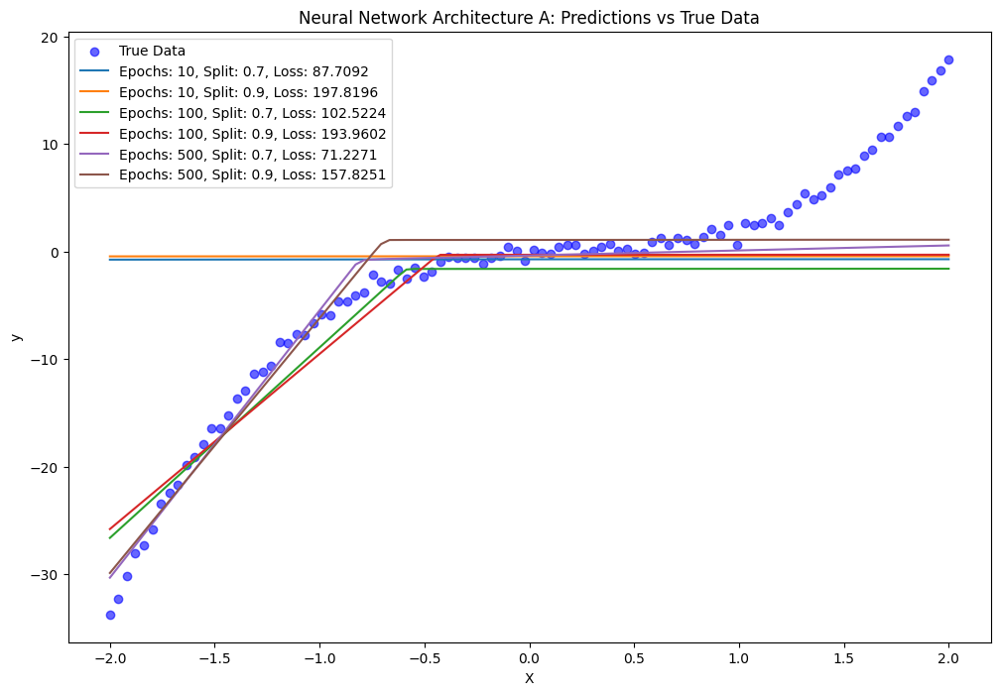

In [ ]:
plot_results(X, y, results_A, "Neural Network Architecture A: Predictions vs True Data")

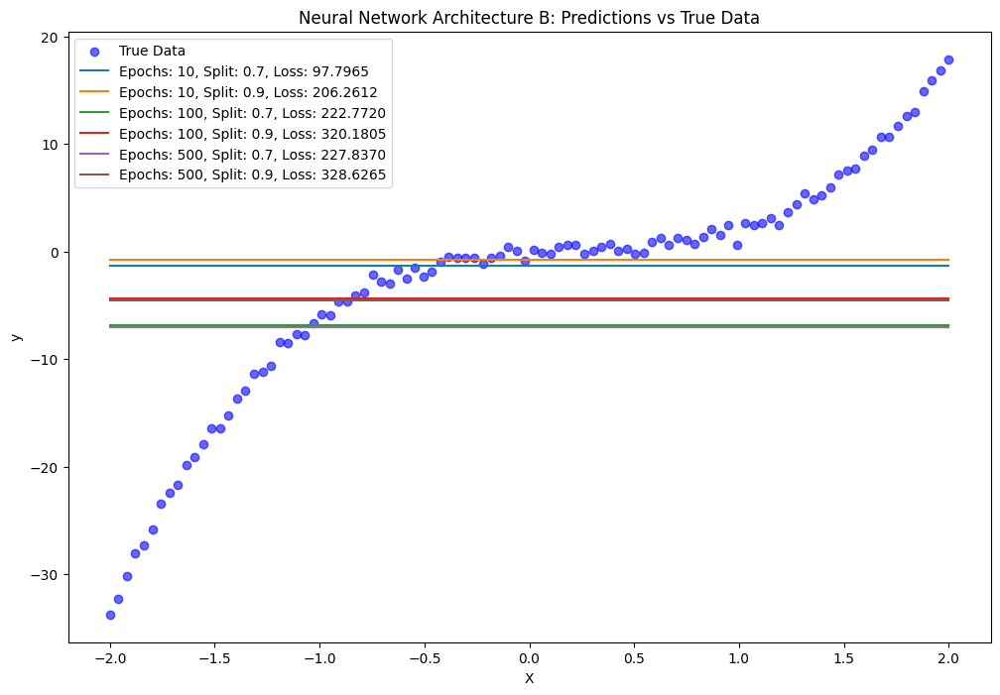

In [ ]:
plot_results(X, y, results_B, "Neural Network Architecture B: Predictions vs True Data")

In [ ]:
def get_last_model_predictions(results):
    # Find the model with the highest number of epochs
    last_model = max(results, key=lambda x: x['epochs'])
    return last_model['y_pred']

In [ ]:
def plot_last_model(X, y, y_pred, title):
    plt.figure(figsize=(12, 8))
    plt.scatter(X, y, label="True Data", color="blue", alpha=0.6)
    plt.plot(X, y_pred, label="Last Model Predictions", color="red", linewidth=2)
    plt.xlabel("X")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()

In [ ]:
hidden_sizes_A = [6, 8]
hidden_sizes_B = [5, 10, 12, 4]
epochs_list = [10, 100, 500]
train_test_splits = [0.7, 0.9]

results_A = train_and_evaluate(NeuralNetworkA, X, y, hidden_sizes_A, epochs_list, train_test_splits)

results_B = train_and_evaluate(NeuralNetworkB, X, y, hidden_sizes_B, epochs_list, train_test_splits)

Epoch 1/10, Loss: 140.3062
Epoch 1/10, Loss: 114.4995
Epoch 1/100, Loss: 140.2561
Epoch 11/100, Loss: 130.8681
Epoch 21/100, Loss: 122.0225
Epoch 31/100, Loss: 109.9104
Epoch 41/100, Loss: 67.7619
Epoch 51/100, Loss: 33.5344
Epoch 61/100, Loss: 20.2115
Epoch 71/100, Loss: 12.2339
Epoch 81/100, Loss: 8.0176
Epoch 91/100, Loss: 5.4984
Epoch 1/100, Loss: 114.4883
Epoch 11/100, Loss: 110.5459
Epoch 21/100, Loss: 107.2166
Epoch 31/100, Loss: 104.1672
Epoch 41/100, Loss: 100.8552
Epoch 51/100, Loss: 95.0029
Epoch 61/100, Loss: 71.3611
Epoch 71/100, Loss: 36.4927
Epoch 81/100, Loss: 24.6728
Epoch 91/100, Loss: 18.8592
Epoch 1/500, Loss: 140.3514
Epoch 11/500, Loss: 131.0921
Epoch 21/500, Loss: 122.3235
Epoch 31/500, Loss: 107.7989
Epoch 41/500, Loss: 47.6083
Epoch 51/500, Loss: 27.2301
Epoch 61/500, Loss: 16.6324
Epoch 71/500, Loss: 10.6656
Epoch 81/500, Loss: 7.1990
Epoch 91/500, Loss: 5.0545
Epoch 101/500, Loss: 3.7698
Epoch 111/500, Loss: 3.0235
Epoch 121/500, Loss: 2.5857
Epoch 131/500, L

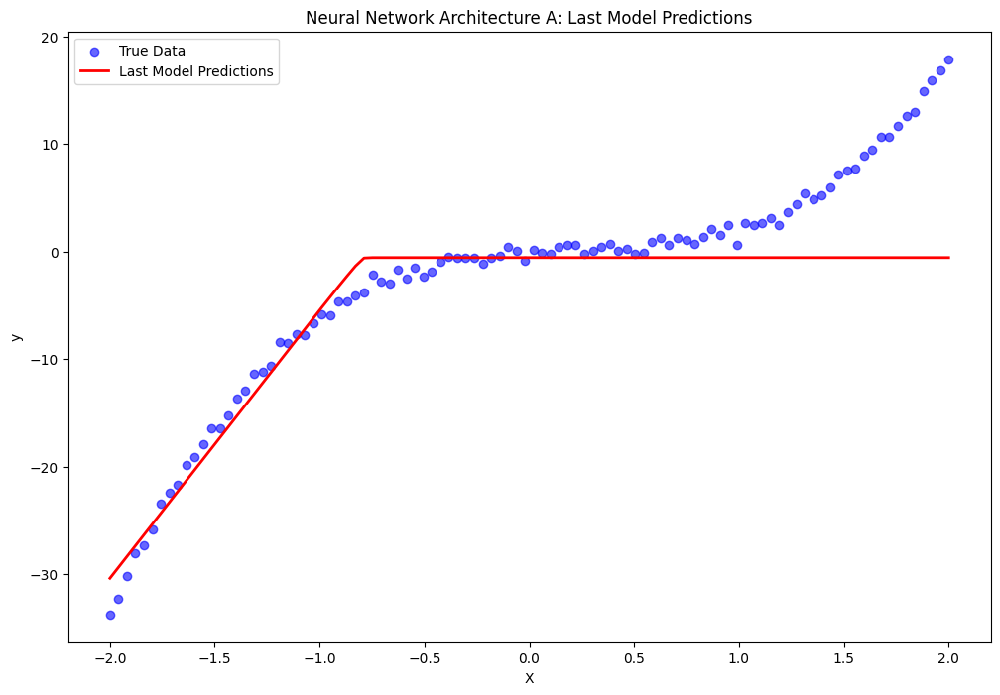

In [ ]:

y_pred_last_A = get_last_model_predictions(results_A)


plot_last_model(X, y, y_pred_last_A, "Neural Network Architecture A: Last Model Predictions")

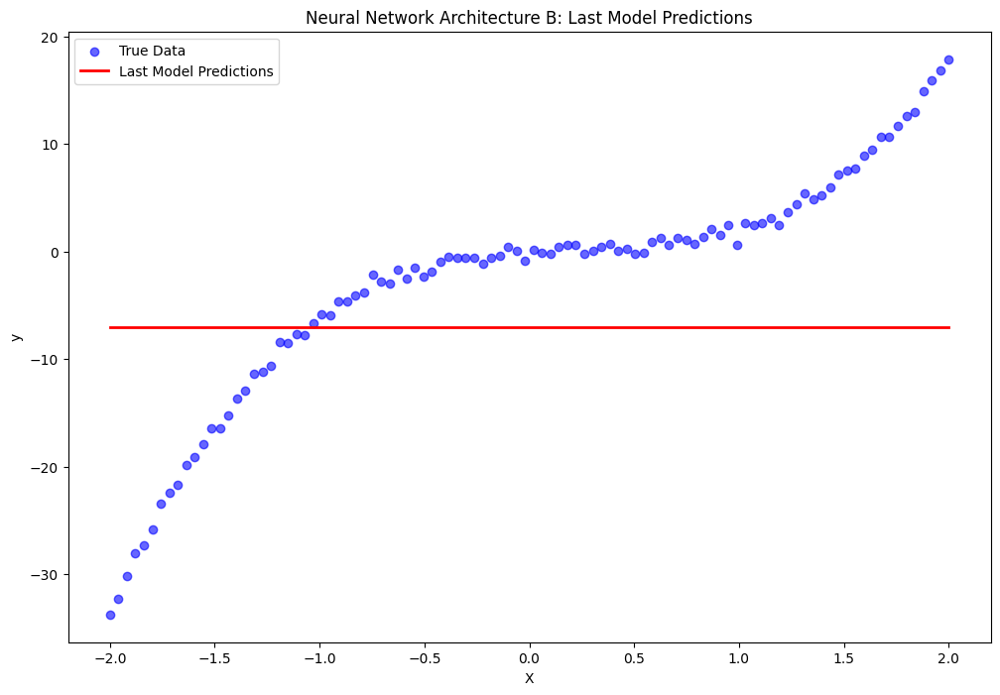

In [ ]:

y_pred_last_B = get_last_model_predictions(results_B)


plot_last_model(X, y, y_pred_last_B, "Neural Network Architecture B: Last Model Predictions")

In [ ]:
class NeuralNetworkB:
    def __init__(self, input_size, hidden_size1, hidden_size2, hidden_size3, hidden_size4, output_size, learning_rate=0.01):
        self.W1 = np.random.randn(input_size, hidden_size1) * 0.1
        self.b1 = np.zeros((1, hidden_size1))
        self.W2 = np.random.randn(hidden_size1, hidden_size2) * 0.1
        self.b2 = np.zeros((1, hidden_size2))
        self.W3 = np.random.randn(hidden_size2, hidden_size3) * 0.1
        self.b3 = np.zeros((1, hidden_size3))
        self.W4 = np.random.randn(hidden_size3, hidden_size4) * 0.1
        self.b4 = np.zeros((1, hidden_size4))
        self.W5 = np.random.randn(hidden_size4, output_size) * 0.1
        self.b5 = np.zeros((1, output_size))
        self.learning_rate = learning_rate

    def relu(self, Z):
        return np.maximum(0, Z)

    def relu_derivative(self, Z):
        return Z > 0

    def forward(self, X):
        self.Z1 = np.dot(X, self.W1) + self.b1
        self.A1 = self.relu(self.Z1)
        self.Z2 = np.dot(self.A1, self.W2) + self.b2
        self.A2 = self.relu(self.Z2)
        self.Z3 = np.dot(self.A2, self.W3) + self.b3
        self.A3 = self.relu(self.Z3)
        self.Z4 = np.dot(self.A3, self.W4) + self.b4
        self.A4 = self.relu(self.Z4)
        self.Z5 = np.dot(self.A4, self.W5) + self.b5
        return self.Z5

    def loss(self, X, y):
        predictions = self.forward(X)
        loss = np.mean((predictions - y) ** 2)
        return loss

    def backward(self, X, y):
        m = X.shape[0]
        y_pred = self.forward(X)

        # Compute gradients
        dZ5 = y_pred - y
        dW5 = (1 / m) * np.dot(self.A4.T, dZ5)
        db5 = (1 / m) * np.sum(dZ5, axis=0, keepdims=True)

        dA4 = np.dot(dZ5, self.W5.T)
        dZ4 = dA4 * self.relu_derivative(self.Z4)
        dW4 = (1 / m) * np.dot(self.A3.T, dZ4)
        db4 = (1 / m) * np.sum(dZ4, axis=0, keepdims=True)

        dA3 = np.dot(dZ4, self.W4.T)
        dZ3 = dA3 * self.relu_derivative(self.Z3)
        dW3 = (1 / m) * np.dot(self.A2.T, dZ3)
        db3 = (1 / m) * np.sum(dZ3, axis=0, keepdims=True)

        dA2 = np.dot(dZ3, self.W3.T)
        dZ2 = dA2 * self.relu_derivative(self.Z2)
        dW2 = (1 / m) * np.dot(self.A1.T, dZ2)
        db2 = (1 / m) * np.sum(dZ2, axis=0, keepdims=True)

        dA1 = np.dot(dZ2, self.W2.T)
        dZ1 = dA1 * self.relu_derivative(self.Z1)
        dW1 = (1 / m) * np.dot(X.T, dZ1)
        db1 = (1 / m) * np.sum(dZ1, axis=0, keepdims=True)

        # Weight update
        self.W1 -= self.learning_rate * dW1
        self.b1 -= self.learning_rate * db1
        self.W2 -= self.learning_rate * dW2
        self.b2 -= self.learning_rate * db2
        self.W3 -= self.learning_rate * dW3
        self.b3 -= self.learning_rate * db3
        self.W4 -= self.learning_rate * dW4
        self.b4 -= self.learning_rate * db4
        self.W5 -= self.learning_rate * dW5
        self.b5 -= self.learning_rate * db5

    def train(self, X, y, epochs=100):
        for epoch in range(epochs):
            self.backward(X, y)

            if epoch % 10 == 0:
                loss = self.loss(X, y)
                print(f"Epoch {epoch + 1}/{epochs}, Loss: {loss:.4f}")

    def predict(self, X):
        return self.forward(X)

Epoch 1/10, Loss: 140.3611
Epoch 1/10, Loss: 114.4965
Epoch 1/100, Loss: 140.3614
Epoch 11/100, Loss: 131.5000
Epoch 21/100, Loss: 124.2435
Epoch 31/100, Loss: 118.2857
Epoch 41/100, Loss: 113.3633
Epoch 51/100, Loss: 109.2414
Epoch 61/100, Loss: 105.7047
Epoch 71/100, Loss: 102.5625
Epoch 81/100, Loss: 99.6808
Epoch 91/100, Loss: 97.0426
Epoch 1/100, Loss: 114.4931
Epoch 11/100, Loss: 110.7599
Epoch 21/100, Loss: 107.6993
Epoch 31/100, Loss: 105.1821
Epoch 41/100, Loss: 103.1023
Epoch 51/100, Loss: 101.3738
Epoch 61/100, Loss: 99.9270
Epoch 71/100, Loss: 98.7080
Epoch 81/100, Loss: 97.6770
Epoch 91/100, Loss: 96.8076
Epoch 1/500, Loss: 140.3570
Epoch 11/500, Loss: 131.4572
Epoch 21/500, Loss: 124.1164
Epoch 31/500, Loss: 117.9583
Epoch 41/500, Loss: 112.6096
Epoch 51/500, Loss: 107.7026
Epoch 61/500, Loss: 102.9859
Epoch 71/500, Loss: 98.5742
Epoch 81/500, Loss: 95.0536
Epoch 91/500, Loss: 92.9127
Epoch 101/500, Loss: 91.9634
Epoch 111/500, Loss: 91.5843
Epoch 121/500, Loss: 91.3092
E

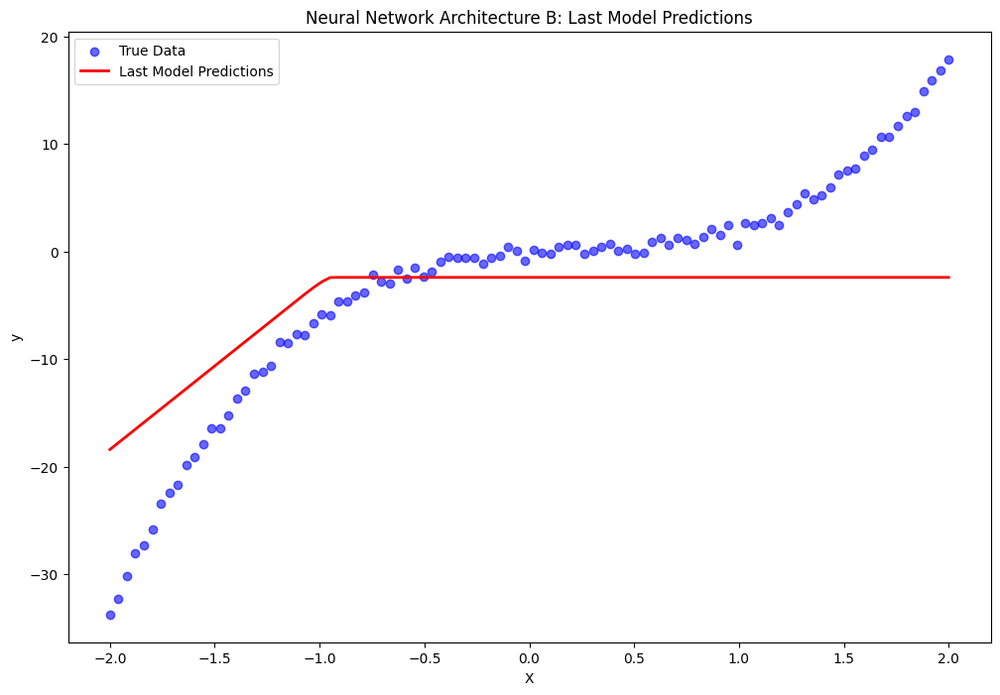

In [ ]:

results_B = train_and_evaluate(NeuralNetworkB, X, y, hidden_sizes_B, epochs_list, train_test_splits)


y_pred_last_B = get_last_model_predictions(results_B)
plot_last_model(X, y, y_pred_last_B, "Neural Network Architecture B: Last Model Predictions")

### Task 2. (50 points)
Consider the Kepler stellar dataset provided in the csv file and described [here](https://archive.stsci.edu/search_fields.php?mission=kepler_stellar17). Predict the mass $y$ based on the other features $X$.


*   Explore the dataset with EDA methods. How large is the dataset? Are there any missing falues? Fill those in or drop, explain your choice. Ensure all the features and the target are of the datatype float. What is the correlation between the features? Display that.
*   Do the train/test split.
*   Define a simple neural network class.
*   Train the model on the train dataset.
*   Evaluate the performance on both train and test dataset. Comment the results.
*   Suggest some idea on what could improve the perfomance of the network. Define a new network based on your idea and test it out.

Together there should be 2 models for this task.








In [ ]:
from google.colab import files

# Upload the file
uploaded = files.upload()

# Check the uploaded file
print(uploaded)

Saving kepler_stellar_17.csv to kepler_stellar_17 (2).csv
{'kepler_stellar_17 (2).csv': b'teff,logg,feh,mass,st_radius,dens,kepmag,dist,degree_ra,degree_dec,jmag,hmag,kmag,av\n5160,3.58,-0.1,1.357,3.128,0.06246,11.678,516.78,291.03873,36.598129,10.126,9.667,9.559,0.32\n5519,3.822,-0.22,1.077,2.109,0.1618,13.152,751.14,291.04306,36.593811,11.656,11.193,11.094,0.432\n4706,2.374,-0.1,2.061,15.447,0.0007876,9.196,658.68,291.05588,36.559952,7.467,6.853,6.722,0.393\n6543,4.082,-0.24,1.18,1.638,0.3781,11.901,490.57,291.0954,36.564941,10.852,10.662,10.627,0.305\n5332,4.5,-0.08,0.821,0.843,1.928,15.264,731.73,291.1376,36.577381,13.665,13.262,13.118,0.425\n6323,4.418,-0.08,1.14,1.093,1.23,13.306,592,290.95517,36.689232,12.215,11.958,11.928,0.36\n5602,4.587,-0.58,0.773,0.741,2.677,14.799,632.41,290.95822,36.686611,13.516,13.147,13.076,0.379\n4729,2.168,0.07,3.652,26.092,0.0002896,11.666,3195.09,290.98108,36.666981,9.784,9.168,9.041,0.577\n5080,3.354,-0.08,1.517,4.29,0.02707,12.38,903.64,291.00104

In [ ]:
file_name = list(uploaded.keys())[0]
df = pd.read_csv(file_name)

In [ ]:
print(f"Dataset size: {df.shape}")

Dataset size: (200038, 14)


In [ ]:
print("Missing values in each column:")
print(df.isnull().sum())

Missing values in each column:
teff             0
logg             0
feh              0
mass          2942
st_radius        0
dens          2942
kepmag          79
dist          2942
degree_ra        0
degree_dec       0
jmag           572
hmag           572
kmag           580
av            2942
dtype: int64


In [ ]:
df = df.dropna()

In [ ]:
def clean_value(value):
    if isinstance(value, str):
        # Replace commas with periods (if any)
        value = value.replace(',', '.')
        # Split on periods and keep only the first two parts (to handle multiple decimals)
        parts = value.split('.')
        if len(parts) > 2:
            value = f"{parts[0]}.{parts[1]}"  # Keep only the first two parts
        return float(value)
    return value

In [ ]:
df = df.applymap(clean_value)

<ipython-input-99-68ae1d3b1818>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(clean_value)


In [ ]:
print("\nFirst few rows of the cleaned dataset:")
print(df.head())
print("\nData types after conversion:")
print(df.dtypes)



First few rows of the cleaned dataset:
   teff   logg   feh   mass  st_radius      dens  kepmag    dist  degree_ra  \
0  5160  3.580 -0.10  1.357      3.128  0.062460  11.678  516.78  291.03873   
1  5519  3.822 -0.22  1.077      2.109  0.161800  13.152  751.14  291.04306   
2  4706  2.374 -0.10  2.061     15.447  0.000788   9.196  658.68  291.05588   
3  6543  4.082 -0.24  1.180      1.638  0.378100  11.901  490.57  291.09540   
4  5332  4.500 -0.08  0.821      0.843  1.928000  15.264  731.73  291.13760   

   degree_dec    jmag    hmag    kmag     av  
0   36.598129  10.126   9.667   9.559  0.320  
1   36.593811  11.656  11.193  11.094  0.432  
2   36.559952   7.467   6.853   6.722  0.393  
3   36.564941  10.852  10.662  10.627  0.305  
4   36.577381  13.665  13.262  13.118  0.425  

Data types after conversion:
teff            int64
logg          float64
feh           float64
mass          float64
st_radius     float64
dens          float64
kepmag        float64
dist          float

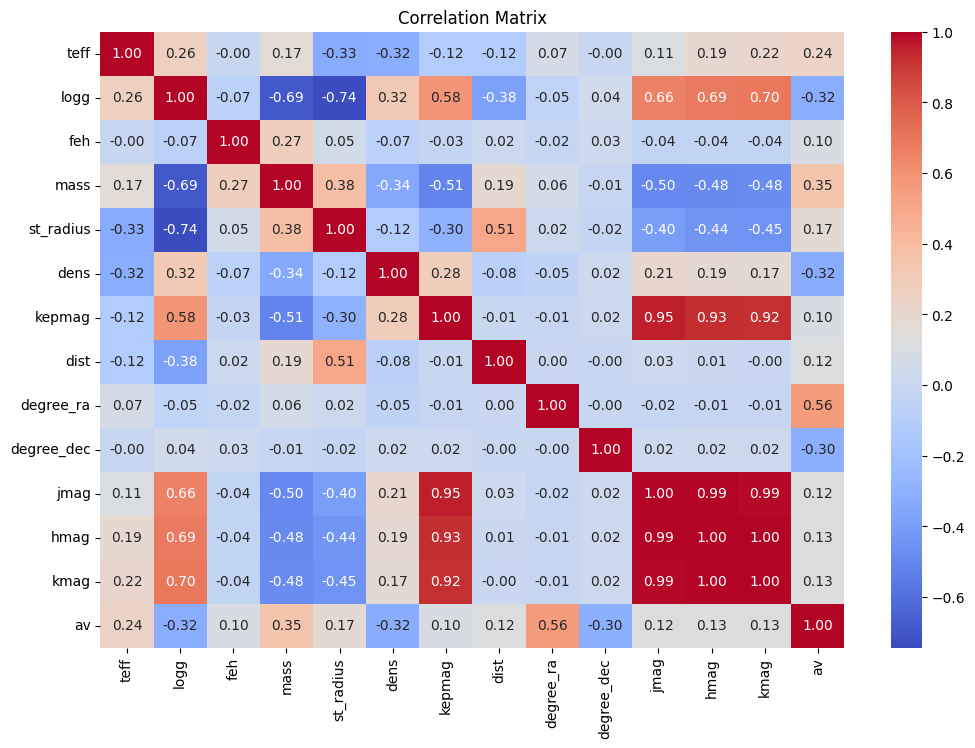

In [ ]:
corr_matrix = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

In [ ]:
X = df.drop("mass", axis=1)  # Replace "mass" with the actual target column name
y = df["mass"]

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
class SimpleNeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size, learning_rate=0.01):
        self.W1 = np.random.randn(input_size, hidden_size) * 0.1
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, output_size) * 0.1
        self.b2 = np.zeros((1, output_size))
        self.learning_rate = learning_rate

    def relu(self, Z):
        return np.maximum(0, Z)

    def relu_derivative(self, Z):
        return Z > 0

    def forward(self, X):
        self.Z1 = np.dot(X, self.W1) + self.b1
        self.A1 = self.relu(self.Z1)
        self.Z2 = np.dot(self.A1, self.W2) + self.b2
        return self.Z2

    def loss(self, X, y):
        predictions = self.forward(X)
        loss = np.mean((predictions - y.values.reshape(-1, 1)) ** 2)
        return loss

    def backward(self, X, y):
      m = X.shape[0]
      y_pred = self.forward(X)

      # Compute gradients
      dZ2 = y_pred - y.values.reshape(-1, 1)
      dW2 = (1 / m) * np.dot(self.A1.T, dZ2)
      db2 = (1 / m) * np.sum(dZ2, axis=0, keepdims=True)

      dA1 = np.dot(dZ2, self.W2.T)
      dZ1 = dA1 * self.relu_derivative(self.Z1)
      dW1 = (1 / m) * np.dot(X.T, dZ1)
      db1 = (1 / m) * np.sum(dZ1, axis=0, keepdims=True)

      # Weight update
      self.W1 -= self.learning_rate * dW1
      self.b1 -= self.learning_rate * db1
      self.W2 -= self.learning_rate * dW2
      self.b2 -= self.learning_rate * db2

    def train(self, X, y, epochs=100):
        for epoch in range(epochs):
            self.backward(X, y)

            if epoch % 10 == 0:
                loss = self.loss(X, y)
                print(f"Epoch {epoch + 1}/{epochs}, Loss: {loss:.4f}")

    def predict(self, X):
        return self.forward(X)

In [ ]:
input_size = X_train.shape[1]
hidden_size = 10
output_size = 1
simple_model = SimpleNeuralNetwork(input_size, hidden_size, output_size)

# Train the simple model
print("\nTraining Simple Neural Network:")
simple_model.train(X_train, y_train, epochs=100)

# Evaluate the simple model
train_predictions = simple_model.predict(X_train)
train_loss = simple_model.loss(X_train, y_train)
print(f"\nSimple Model - Training Loss: {train_loss:.4f}")

test_predictions = simple_model.predict(X_test)
test_loss = simple_model.loss(X_test, y_test)
print(f"Simple Model - Testing Loss: {test_loss:.4f}")


Training Simple Neural Network:
Epoch 1/100, Loss: 6429316405184930816.0000
Epoch 11/100, Loss: 121273728246134.9375
Epoch 21/100, Loss: 99190623680795.0625
Epoch 31/100, Loss: 81128699253118.4688
Epoch 41/100, Loss: 66355725957364.9141
Epoch 51/100, Loss: 54272808609829.4688
Epoch 61/100, Loss: 44390106684866.2734
Epoch 71/100, Loss: 36306976218233.3828
Epoch 81/100, Loss: 29695727732070.8203
Epoch 91/100, Loss: 24288341729059.2539

Simple Model - Training Loss: 20268955415702.4023
Simple Model - Testing Loss: 20268955355741.3242
